In [2]:
import pandas as pd
import matplotlib.pyplot as plt


In [3]:
# Load data
url = "https://github.com/ArinB/MSBA-CA-Data/blob/main/CA03/census_data.csv?raw=true"
data = pd.read_csv(url, encoding = "ISO-8859-1")
print("The shape of the data: ", data.shape)
data.head(10)

The shape of the data:  (48842, 11)


,hours_per_week_bin,occupation_bin,msr_bin,capital_gl_bin,race_sex_bin,education_num_bin,education_bin,workclass_bin,age_bin,flag,y
0,b. 31-40,b. Mid - Low,b. Mid,c. > 0,c. High,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,train,0
1,a. 0-30,e. High,c. High,a. = 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,train,0
2,b. 31-40,a. Low,b. Mid,a. = 0,c. High,b. 9-12,b. Mid,b. income,d. 36-40 & 56-60,train,0
3,b. 31-40,a. Low,c. High,a. = 0,b. Mid,a. 0-8,a. Low,b. income,e. 40-55,train,0
4,b. 31-40,e. High,c. High,a. = 0,a. Low,c. 13,c. Bachelors,b. income,b. 26-30 & 71-100,train,0
5,b. 31-40,e. High,c. High,a. = 0,b. Mid,d. 14,d. Masters,b. income,d. 36-40 & 56-60,train,0
6,a. 0-30,a. Low,b. Mid,a. = 0,a. Low,a. 0-8,a. Low,b. income,e. 40-55,train,0
7,d. 41-50 & 61-70,e. High,c. High,a. = 0,c. High,b. 9-12,b. Mid,b. income,e. 40-55,train,1
8,d. 41-50 & 61-70,e. High,b. Mid,c. > 0,b. Mid,d. 14,d. Masters,b. income,c. 31-35 & 61-70,train,1
9,b. 31-40,e. High,c. High,c. > 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,train,1


# Part I


### 1. Data Quality Analytics (DQA)
Do all of these inside your Notebook: <br>
• Perform a Data Quality Analysis to find missing values, outliers, NaNs etc.<br>
• Display descriptive statistics of each column <br>
• Perform necessary data cleansing and transformation based on your
observations from the data quality analysis <br>
https://towardsdatascience.com/an-introduction-to-discretization-in-data-science-55ef8c9775a2

In [4]:
# find missing values
data.isnull().sum()

hours_per_week_bin    0
occupation_bin        0
msr_bin               0
capital_gl_bin        0
race_sex_bin          0
education_num_bin     0
education_bin         0
workclass_bin         0
age_bin               0
flag                  0
y                     0
dtype: int64

In [5]:
# Descriptive statistics for each column
for column in data:   # iterate through columns
  print("Value counts of:", column)
  print(data[column].value_counts())
  print("-"*40)

Value counts of: hours_per_week_bin
b. 31-40            26639
d. 41-50 & 61-70     9819
a. 0-30              7851
e. 51-60             3759
c. 71-100             774
Name: hours_per_week_bin, dtype: int64
----------------------------------------
Value counts of: occupation_bin
c. Mid - Mid     13971
b. Mid - Low     12947
e. High          12258
a. Low            7237
d. Mid - High     2429
Name: occupation_bin, dtype: int64
----------------------------------------
Value counts of: msr_bin
c. High    22047
b. Mid     15868
a. Low     10927
Name: msr_bin, dtype: int64
----------------------------------------
Value counts of: capital_gl_bin
a. = 0    42525
c. > 0     4035
b. < 0     2282
Name: capital_gl_bin, dtype: int64
----------------------------------------
Value counts of: race_sex_bin
c. High    29737
b. Mid     16457
a. Low      2648
Name: race_sex_bin, dtype: int64
----------------------------------------
Value counts of: education_num_bin
b. 9-12    30324
c. 13       8025
a. 0-8

### 2. Exploratory Data Analysis (EDA)
First, understand the data. Open the .csv file in an Excel spreadsheet and study the 
data columns and the data visually. Then, perform EDA (in your Notebook) of the 
income group with respect to the seven explanatory variables and display graphical 
representations as shown below. Before you do the EDA, you need to do transform 
the data into “categorical” columns by doing the “data binning” with respect to 
SEVEN explanatory variables and their specified number of “bins”. You will also find 
the “bin” value ranges for each of the seven variables in the graphs. If your EDA 
data transformation and graphing code is correct the output of your EDA will look 
like the graphs displayed below. Do all of these inside your Notebook. (Hint: Use 
Stacked Bar Chart options in MatPlotLib).

y                      0      1
age_bin                        
a. 0-25            98.24   1.76
b. 26-30 & 71-100  86.14  13.86
c. 31-35 & 61-70   75.73  24.27
d. 36-40 & 56-60   66.90  33.10
e. 40-55           61.81  38.19


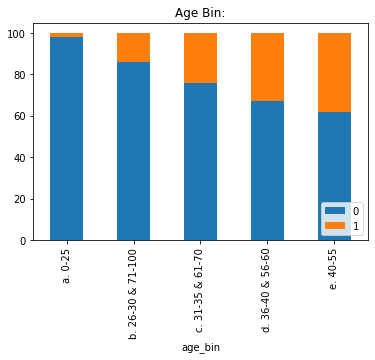

In [6]:
# stack bar for age
plt_data = data.groupby(['age_bin', 'y']).size().unstack()
plt_data=plt_data.apply(lambda x: round(x/x.sum()*100,2), axis=1)
print(plt_data)

plt_data.plot(kind = 'bar', stacked = True)
plt.title('Age Bin:')
plt.legend(loc='lower right')

y                   0      1
capital_gl_bin              
a. = 0          81.07  18.93
b. < 0          49.87  50.13
c. > 0          38.27  61.73


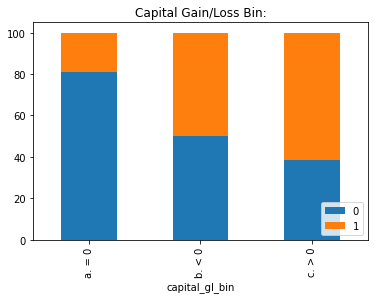

In [7]:
# stack bar for capital gain / loss
plt_data = data.groupby(['capital_gl_bin', 'y']).size().unstack()
plt_data=plt_data.apply(lambda x: round(x/x.sum()*100,2), axis=1)
print(plt_data)

plt_data.plot(kind = 'bar', stacked = True)
plt.title('Capital Gain/Loss Bin:')
plt.legend(loc='lower right')

y                  0      1
education_bin              
a. Low         94.29   5.71
b. Mid         81.86  18.14
c. Bachelors   58.72  41.28
d. Masters     45.09  54.91
e. High        26.61  73.39


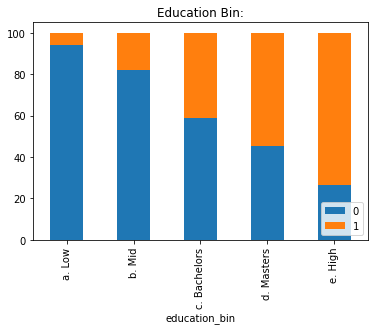

In [8]:
# stack bar for education
plt_data = data.groupby(['education_bin', 'y']).size().unstack()
plt_data=plt_data.apply(lambda x: round(x/x.sum()*100,2), axis=1)
print(plt_data)

plt_data.plot(kind = 'bar', stacked = True)
plt.title('Education Bin:')
plt.legend(loc='lower right')

y                       0      1
hours_per_week_bin              
a. 0-30             93.30   6.70
b. 31-40            79.66  20.34
c. 71-100           65.50  34.50
d. 41-50 & 61-70    60.78  39.22
e. 51-60            56.80  43.20


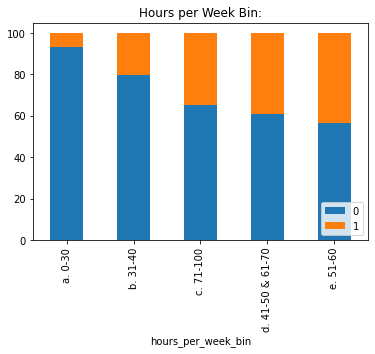

In [9]:
# stack bar for hours per week
plt_data = data.groupby(['hours_per_week_bin', 'y']).size().unstack()
plt_data=plt_data.apply(lambda x: round(x/x.sum()*100,2), axis=1)
print(plt_data)

plt_data.plot(kind = 'bar', stacked = True)
plt.title('Hours per Week Bin:')
plt.legend(loc='lower right')

y            0      1
msr_bin              
a. Low   98.39   1.61
b. Mid   90.09   9.91
c. High  54.92  45.08


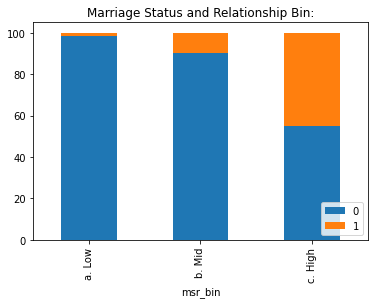

In [10]:
# stack bar for marriage status and relationship
plt_data = data.groupby(['msr_bin', 'y']).size().unstack()
plt_data=plt_data.apply(lambda x: round(x/x.sum()*100,2), axis=1)
print(plt_data)

plt_data.plot(kind = 'bar', stacked = True)
plt.title('Marriage Status and Relationship Bin:')
plt.legend(loc='lower right')

y                   0      1
occupation_bin              
a. Low          95.23   4.77
b. Mid - Low    87.77  12.23
c. Mid - Mid    76.10  23.90
d. Mid - High   70.03  29.97
e. High         53.57  46.43


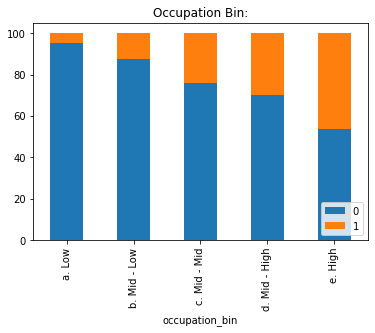

In [11]:
# stack bar for occupation
plt_data = data.groupby(['occupation_bin', 'y']).size().unstack()
plt_data=plt_data.apply(lambda x: round(x/x.sum()*100,2), axis=1)
print(plt_data)

plt_data.plot(kind = 'bar', stacked = True)
plt.title('Occupation Bin:')
plt.legend(loc='lower right')

y                 0      1
race_sex_bin              
a. Low        94.03   5.97
b. Mid        87.09  12.91
c. High       68.37  31.63


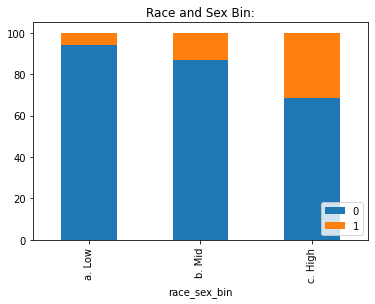

In [12]:
# stack bar for race and sex
plt_data = data.groupby(['race_sex_bin', 'y']).size().unstack()
plt_data=plt_data.apply(lambda x: round(x/x.sum()*100,2), axis=1)
print(plt_data)

plt_data.plot(kind = 'bar', stacked = True)
plt.title('Race and Sex Bin:')
plt.legend(loc='lower right')

# Part II

### 3. Build Decision Tree Classifier Models <br>
**Definition**: Given a data of attributes together with its classes, a decision tree 
produces a sequence of rules that can be used to classify the data.<br><br>
**Advantages**: Decision Tree is simple to understand and visualize, requires little data 
preparation, and can handle both numerical and categorical data.<br><br>
**Disadvantages**: Decision tree can create complex trees that do not generalize well, 
and decision trees can be unstable because small variations in the data might result in 
a completely different tree being generated.<br><br>
Use “DecisionTreeClassifier” algorithm from scikit learn. Find details of sklearn tree 
algorithm below. Scitkit Learn implements an optimized version of CART algorithm and 
can be used for binary class as well as multi-class classifications. It can be used for 
classification, as well as regression. Study the following link thoroughly, including 
Section 1.10.5 (Tips on Practical Use)<br>
https://scikit-learn.org/stable/modules/tree.html#tree-algorithms-id3-c4-5-c5-0-and-cart

In [42]:
# splitling train and test mannually
x_cols = ['hours_per_week_bin',	'occupation_bin', 'msr_bin',	'capital_gl_bin',	'race_sex_bin',	'education_num_bin',	'education_bin',	'workclass_bin',	'age_bin']
train_data = data[data.flag == 'train']
test_data = data[data.flag == 'test']
X_train = train_data[x_cols]
y_train = train_data['y']
X_test = test_data[x_cols]
y_test = test_data['y']
print(X_train.head())
print(y_train.head())
print(X_test.head())
print(y_test.head())

  hours_per_week_bin occupation_bin  ... workclass_bin            age_bin
0           b. 31-40   b. Mid - Low  ...     b. income   d. 36-40 & 56-60
1            a. 0-30        e. High  ...     b. income           e. 40-55
2           b. 31-40         a. Low  ...     b. income   d. 36-40 & 56-60
3           b. 31-40         a. Low  ...     b. income           e. 40-55
4           b. 31-40        e. High  ...     b. income  b. 26-30 & 71-100

[5 rows x 9 columns]
0    0
1    0
2    0
3    0
4    0
Name: y, dtype: int64
      hours_per_week_bin occupation_bin  ... workclass_bin            age_bin
32561           b. 31-40   b. Mid - Low  ...     b. income            a. 0-25
32562   d. 41-50 & 61-70   b. Mid - Low  ...     b. income   d. 36-40 & 56-60
32563           b. 31-40  d. Mid - High  ...     b. income  b. 26-30 & 71-100
32564           b. 31-40   b. Mid - Low  ...     b. income           e. 40-55
32565            a. 0-30   b. Mid - Low  ...  a. no income            a. 0-25

[5 rows 

In [43]:
X_train.to_csv('x1.csv')

In [15]:
# from sklearn.model_selection import train_test_split
# X_train, X_test, y_train, y_test = train_test_split(data[x_cols], data['y'])
# print(X_train.head())
# print(y_train.head())
# print(X_test.head())
# print(y_test.head())

In [16]:
# install category_encoders
!pip install category_encoders

     |████████████████████████████████| 82 kB 359 kB/s 


In [46]:
# using ordinal encoder to convert string variables into float variable because Decision tree classifier cannot take strings as input
import category_encoders as ce
encoder = ce.OrdinalEncoder(cols = x_cols)
X_train = encoder.fit_transform(X_train)
X_test = encoder.transform(X_test)

In [47]:
X_train.to_csv('x2.csv')

In [37]:
# Examine X_train, X_test
print(X_train.head())
print(X_test.head())

   hours_per_week_bin  occupation_bin  ...  workclass_bin  age_bin
0                   1               1  ...              1        1
1                   2               2  ...              1        2
2                   1               3  ...              1        1
3                   1               3  ...              1        2
4                   1               2  ...              1        3

[5 rows x 9 columns]
       hours_per_week_bin  occupation_bin  ...  workclass_bin  age_bin
32561                   1               1  ...              1        5
32562                   3               1  ...              1        1
32563                   1               5  ...              1        3
32564                   1               1  ...              1        2
32565                   2               1  ...              2        5

[5 rows x 9 columns]


In [35]:
for column in X_train:   # iterate through columns
  print("Value counts of:", column)
  print(data[column].value_counts())
  print("-"*40)

Value counts of: hours_per_week_bin
b. 31-40            26639
d. 41-50 & 61-70     9819
a. 0-30              7851
e. 51-60             3759
c. 71-100             774
Name: hours_per_week_bin, dtype: int64
----------------------------------------
Value counts of: occupation_bin
c. Mid - Mid     13971
b. Mid - Low     12947
e. High          12258
a. Low            7237
d. Mid - High     2429
Name: occupation_bin, dtype: int64
----------------------------------------
Value counts of: msr_bin
c. High    22047
b. Mid     15868
a. Low     10927
Name: msr_bin, dtype: int64
----------------------------------------
Value counts of: capital_gl_bin
a. = 0    42525
c. > 0     4035
b. < 0     2282
Name: capital_gl_bin, dtype: int64
----------------------------------------
Value counts of: race_sex_bin
c. High    29737
b. Mid     16457
a. Low      2648
Name: race_sex_bin, dtype: int64
----------------------------------------
Value counts of: education_num_bin
b. 9-12    30324
c. 13       8025
a. 0-8

In [20]:
# instatiate the DecisionTreeClassifier model with criterion gini index
from sklearn.tree import DecisionTreeClassifier
dtree = DecisionTreeClassifier(max_depth = 10, random_state = 120,
                               max_features = None, min_samples_leaf = 15)
dtree.fit(X_train, y_train)
y_pred = dtree.predict(X_test)

### 4. Visualize Your Decision Tree using GraphViz

Get the detail of how to do this from the following link: <br>
https://medium.com/@rnbrown/creating-and-visualizing-decision-trees-with-python-f8e8fa394176

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.985326 to fit



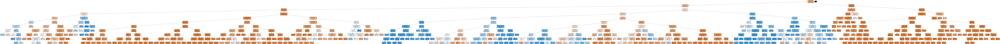

In [21]:
from six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

dot_data = StringIO()
export_graphviz(dtree, out_file=dot_data,
                feature_names=X_train.columns,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

### 5. Evaluate Decision Tree Performance <br>
Calculate and display the following. Do all of these inside your Notebook. <br>
• Confusion Matrix (TP, TN, FP, FN … etc.) <br>
• Accuracy, Precision, Recall, F1 Score, AUC Value, ROC Curve (graph)<br>

In [22]:
# Confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_test, y_pred)
print(cf_matrix)

[[11637   798]
 [ 1796  2050]]


In [23]:
# Accuracy score
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(y_test, y_pred)
print(accuracy)

0.8406731773232602


In [24]:
# Precision score
from sklearn.metrics import precision_score
precision = precision_score(y_test, y_pred)
print(precision)

0.7198033707865169


In [25]:
# Recall
from sklearn.metrics import recall_score
recall = recall_score(y_test, y_pred)
print(recall)

0.5330213208528342


In [26]:
# F1 Score
from sklearn.metrics import f1_score
f1_score = f1_score(y_test, y_pred)
print(f1_score)

0.6124887959366597


In [27]:
# AUC 
from sklearn.metrics import roc_auc_score
auc = roc_auc_score(y_test, y_pred)
auc

0.7344238087979491

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


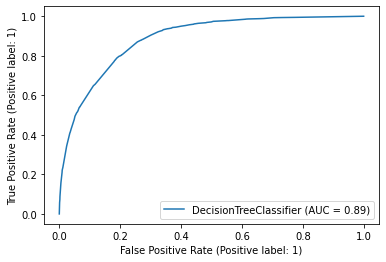

In [28]:
from sklearn.metrics import plot_roc_curve
plot_roc_curve(dtree, X_test, y_test) 
plt.show()

# Part III

### 6. Tune Decision Tree Performance <BR>
Learn about all hyper-parameters and methods of Scikit Learn DecisionTreeClassifier 
algorithm at: <BR>
https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html#sklearn.tree.DecisionTreeClassifier <BR>


In [29]:
# Tree tuning
criterion = 'entropy'
min_samples_split = 55
min_samples_leaf = 15
max_depth = 15

dtree = DecisionTreeClassifier(criterion = criterion, max_depth = max_depth, random_state = 120, min_samples_split = min_samples_split,
                               max_features = None, min_samples_leaf = min_samples_leaf)
dtree.fit(X_train, y_train)
y_pred = dtree.predict(X_test)

# accuracy
accuracy = accuracy_score(y_test, y_pred)
# recall
recall = recall_score(y_test, y_pred)
# Precision
precision = precision_score(y_test, y_pred)
# F1 Score
from sklearn.metrics import f1_score
f1_score = f1_score(y_test, y_pred)
print('Accuracy: ', accuracy)
print('Recall: ', recall)
print('Precision: ', precision)
print('F1 Score: ', f1_score)

Accuracy:  0.844419875928997
Recall:  0.5670826833073322
Precision:  0.7153164972122007
F1 Score:  0.6326323422770123


### 7. Conclusion <br>
Explain your observations from the above performance tuning effort.<br>
Q.8.1 How long was your total run time to train the model? <br>
- A: Less than 1 second per training

Q.8.2 Did you find the BEST TREE? <br>
- A: Somewhat. The best combination of hyperparameters is:
>criterion = 'gini'<br>
min_samples_split = 55<br>
min_samples_leaf = 15<br>
max_depth = 15<br>

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; It returns the followering metrics: 
> accuracy: 0.824 <br>
recall: 0.570 <br>
precision: 0.715 <br>
F1 score: 0.634


Q.8.3 Draw the Graph of the BEST TREE Using GraphViz<br>
- A: in the following code block

Q.8.4 What makes it the best tree?<br>
A: The best tree has the highest overall metrics. Although for one metrics to be higher, sometimes we need to sacrifies other metrics

In [30]:
# graph the best tree
best_dtree = DecisionTreeClassifier(criterion = 'gini', max_depth = 15, random_state = 120, min_samples_split = 55,
                               max_features = None, min_samples_leaf = 15)
best_dtree.fit(X_train, y_train)

dot_data = StringIO()
export_graphviz(best_dtree, out_file=dot_data,
                feature_names=X_train.columns,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.76307 to fit



# Part IV

### 8. Automation of Performance Tuning <br>
Instead of running your program manually eight times for eight cases, can you 
“automate” generation of the above “Hyperparameter Vs. Model Performance Table” in your code itself, so that the completed performance table can be displayed with all eight cases by running it only once?

In [49]:
autotune = pd.read_csv('autotune.csv')
autotune

for i in autotune.index:
  print('Hyperparameters: ')
  print('Split Criteria: ', autotune.split_criteria[i])
  print('Minimum Sample Split: ', autotune.min_sample_split[i])
  print('Minimum Sample leaf: ', autotune.min_sample_leaf[i])
  print('Minimum Sample leaf: ', autotune.max_depth[i])

  criterion = autotune.split_criteria[i]
  min_samples_split = autotune.min_sample_split[i]
  min_samples_leaf = autotune.min_sample_leaf[i]
  max_depth = autotune.max_depth[i]

  dtree = DecisionTreeClassifier(criterion = criterion, max_depth = max_depth, random_state = 120, min_samples_split = min_samples_split,
                               max_features = None, min_samples_leaf = min_samples_leaf)
  dtree.fit(X_train, y_train)
  y_pred = dtree.predict(X_test)

  # accuracy
  accuracy = accuracy_score(y_test, y_pred)
  # recall
  recall = recall_score(y_test, y_pred)
  # Precision
  precision = precision_score(y_test, y_pred)
  # F1 Score
  from sklearn.metrics import f1_score
  f1_score = f1_score(y_test, y_pred)
  print('Accuracy: ', accuracy)
  print('Recall: ', recall)
  print('Precision: ', precision)
  print('F1 Score: ', f1_score)
  print('-'*40)

Hyperparameters: 
Split Criteria:  gini
Minimum Sample Split:  2
Minimum Sample leaf:  1
Minimum Sample leaf:  5
Accuracy:  0.8243965358393219
Recall:  0.4326573062922517
Precision:  0.710807347287484
F1 Score:  0.5379020526911266
----------------------------------------
Hyperparameters: 
Split Criteria:  gini
Minimum Sample Split:  2
Minimum Sample leaf:  15
Minimum Sample leaf:  10
Accuracy:  0.8406731773232602
Recall:  0.5330213208528342
Precision:  0.7198033707865169
F1 Score:  0.6124887959366597
----------------------------------------
Hyperparameters: 
Split Criteria:  gini
Minimum Sample Split:  10
Minimum Sample leaf:  20
Minimum Sample leaf:  10
Accuracy:  0.840366070880167
Recall:  0.5332813312532502
Precision:  0.7183887915936953
F1 Score:  0.6121474406804955
----------------------------------------
Hyperparameters: 
Split Criteria:  gini
Minimum Sample Split:  55
Minimum Sample leaf:  15
Minimum Sample leaf:  15
Accuracy:  0.8447884036607088
Recall:  0.5696827873114925
Prec

# Part V

### 9. Prediction using your “trained” Decision Tree Model <br>
Based on the Performance Tuning effort in the previous section, pick your BEST 
PERFORMING TREE. Now make prediction of a “new” individual’s Income Category ( 
<=50K, or >50K ) with the following information. Do this in your Notebook.

>• Hours Worked per Week = 48<br>
• Occupation Category = Mid - Low<br>
• Marriage Status & Relationships = High<br>
• Capital Gain = Yes<br>
• Race-Sex Group = Mid<br>
• Number of Years of Education = 12<br>
• Education Category = High<br>
• Work Class = Income<br>
• Age = 58<br>


In [53]:
new_indiv = pd.DataFrame({'hours_per_week_bin':[3],
                        'occupation_bin':[4],
                        'msr_bin':[2],
                        'capital_gl_bin':[1],
                        'race_sex_bin':[2],
                        'education_num_bin':[2],
                        'education_bin':[5],
                        'workclass_bin':[1],
                        'age_bin':[1]})
prediction = best_dtree.predict(new_indiv)
prediction_prob = best_dtree.predict_proba(new_indiv)
print(prediction)
print(prediction_prob)

[1]
[[0.18421053 0.81578947]]


Q.10.1 What is the probability of the outcome of the prediction for this ? What is your decision probability threshold and what is your predicted decision based on that?<br>
A: The probablity of this individual's income would be less 50k is 0.184, and the probability that the income is more than 50k is 0.816 <br>
Q. 10.2 What is the probability that your outcome prediction is accurate? <br>
A: The probability of this prediction is accurate is 0.845